Data : https://universe.roboflow.com/search?q=chess%20pieces

In [ ]:
#conda create --name detectron2_env python=3.11.7
#conda activate detectron2_env

In [ ]:
!pip install torch==2.2.1 torchvision==0.17.1 torchaudio==2.2.1 --index-url https://download.pytorch.org/whl/cu118

In [ ]:
import torch
torch.__version__

In [ ]:
!git clone https://github.com/facebookresearch/detectron2

In [ ]:
!pip install tabulate termcolor fvcore opencv-python cloudpickle omegaconf pycocotools cython pyyaml==5.1

In [ ]:
!pip list

In [1]:
import sys, os, distutils.core
dist = distutils.core.run_setup("./detectron2/setup.py")

In [2]:
sys.path.insert(0, os.path.abspath('./detectron2'))

In [3]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Wed_Sep_21_10:41:10_Pacific_Daylight_Time_2022
Cuda compilation tools, release 11.8, V11.8.89
Build cuda_11.8.r11.8/compiler.31833905_0
torch:  2.2 ; cuda:  cu118
detectron2: 0.6


# Install Detectron2 Dependencies

In [4]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
#from google.colab.patches import cv2_imshow

import random
# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
import matplotlib.pyplot as plt


matplotlib data path: c:\Users\yxzhh\anaconda3\envs\detectron_2_0529\Lib\site-packages\matplotlib\mpl-data
CONFIGDIR=C:\Users\yxzhh\.matplotlib
interactive is False
platform is win32
CACHEDIR=C:\Users\yxzhh\.matplotlib
Using fontManager instance from C:\Users\yxzhh\.matplotlib\fontlist-v390.json


# Import and Register Custom Detectron2 Data

In [ ]:
#!curl -L "https://universe.roboflow.com/ds/4v3RxrEpno?key=u0B1sxI9tH" > roboflow.zip

In [ ]:
'''
from zipfile import ZipFile

zip = ZipFile('roboflow.zip')
zip.extractall('content')
zip.close()
'''

remember to put the coco-style json file in both train and test folder

In [5]:
from detectron2.data.datasets import register_coco_instances
#register_coco_instances("my_dataset_train", {}, "C:/Users/yxzhh/Desktop/Machine_Learning/Dectectron2/detectron_2_trial/content/train/_annotations.coco.json", "C:/Users/yxzhh/Desktop/Machine_Learning/Dectectron2/detectron_2_trial/content/train")
#register_coco_instances("my_dataset_test", {}, "C:/Users/yxzhh/Desktop/Machine_Learning/Dectectron2/detectron_2_trial/content/test/_annotations.coco.json", "C:/Users/yxzhh/Desktop/Machine_Learning/Dectectron2/detectron_2_trial/content/test")
register_coco_instances("my_dataset_train", {}, "C:/Users/yxzhh/Desktop/Machine_Learning/Dectectron2/detectron_2_trial/segmentation_data/train/_annotations.coco.json", "C:/Users/yxzhh/Desktop/Machine_Learning/Dectectron2/detectron_2_trial/segmentation_data/train")
register_coco_instances("my_dataset_test", {}, "C:/Users/yxzhh/Desktop/Machine_Learning/Dectectron2/detectron_2_trial/segmentation_data/valid/_annotations.coco.json", "C:/Users/yxzhh/Desktop/Machine_Learning/Dectectron2/detectron_2_trial/segmentation_data/valid")


In [6]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    #cv2_imshow(vis.get_image()[:, :, ::-1])

'''
# Display the image with contours
cv2.imshow("Image with masks", vis.get_image()[:, :, ::-1])
cv2.waitKey(0)
cv2.destroyAllWindows()
'''

WARNING [05/30 16:31:31 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[05/30 16:31:31 d2.data.datasets.coco]: Loaded 1992 images in COCO format from C:/Users/yxzhh/Desktop/Machine_Learning/Dectectron2/detectron_2_trial/segmentation_data/train/_annotations.coco.json
findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=10.0.
findfont: score(FontEntry(fname='c:\\Users\\yxzhh\\anaconda3\\envs\\detectron_2_0529\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSansMono-Bold.ttf', name='DejaVu Sans Mono', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='c:\\Users\\yxzhh\\anaconda3\\envs\\detectron_2_0529\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\cmr10.ttf', name='cmr10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fna

'\n# Display the image with contours\ncv2.imshow("Image with masks", vis.get_image()[:, :, ::-1])\ncv2.waitKey(0)\ncv2.destroyAllWindows()\n'

findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=6.761067708333334.
findfont: score(FontEntry(fname='c:\\Users\\yxzhh\\anaconda3\\envs\\detectron_2_0529\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSansMono-Bold.ttf', name='DejaVu Sans Mono', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
findfont: score(FontEntry(fname='c:\\Users\\yxzhh\\anaconda3\\envs\\detectron_2_0529\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\cmr10.ttf', name='cmr10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='c:\\Users\\yxzhh\\anaconda3\\envs\\detectron_2_0529\\Lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\cmsy10.ttf', name='cmsy10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
findfont: score(FontEntry(fname='c:\\Users\\yxzhh\\anaconda3\\envs\\detectron_2_0529\\Lib\\s

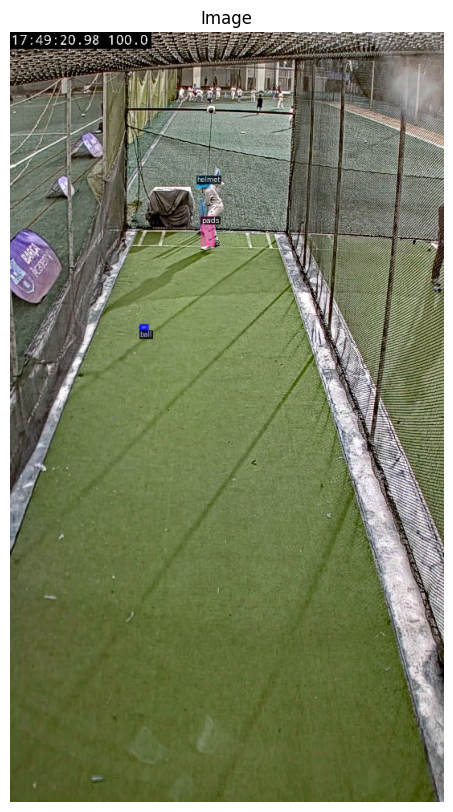

In [7]:
# Assuming vis is an object from a library that provides get_image() method
image = vis.get_image()

# Swap channels (BGR to RGB) for matplotlib display
image = image[:, :, ::-1]  # Assuming BGR format

# Create a figure
plt.figure(figsize=(20, 10))  # Set figure size to display the full-size image

# Display the image using imshow
plt.imshow(image)

# Adjust plot (optional)
plt.title("Image")  # Add a title
plt.axis("off")  # Hide axes

# Show the plot
plt.show()

# Train Custom Detectron2 Detector

In [8]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
#cfg.merge_from_file(model_zoo.get_config_file("/configs/COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.merge_from_file(model_zoo.get_config_file("/configs/COCO-InstanceSegmentation/mask_rcnn_R_101_DC5_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
#cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_101_DC5_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.0025  # pick a good LR
cfg.SOLVER.MAX_ITER = 500   # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 6  # (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.


In [ ]:
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=True)
trainer.train()

In [ ]:
'''
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output
'''

In [9]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
cfg.DATASETS.TEST = ("my_dataset_test", )
predictor = DefaultPredictor(cfg)

[05/30 16:31:38 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output\model_final.pth ...
[Checkpointer] Loading from ./output\model_final.pth ...


# Inference with Detectron2 Saved Weights



In [10]:
test_metadata = MetadataCatalog.get("my_dataset_test")

In [11]:

with open(test_metadata.json_file) as f:
    coco_data = json.load(f)

# Extract category names without considering supercategories
category_names = [cat["name"] for cat in coco_data["categories"]]

f.close()

In [ ]:
from detectron2.utils.visualizer import ColorMode
import glob
from tqdm import tqdm

#for imageName in glob.glob('/content/test/*jpg'):
image_files = glob.glob('segmentation_data/valid/*jpg') # Get list of image files
for imageName in tqdm(image_files, desc="Processing Images"): # Loop through images and process them with a progress bar
  im = cv2.imread(imageName)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata,
                scale=0.8
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

'''
# Display the image with contours
cv2.imshow("Image with masks", out.get_image()[:, :, ::-1])
cv2.waitKey(0)
cv2.destroyAllWindows()
'''


In [ ]:
# Extract image from Visualizer output
image = out.get_image()[:, :, ::-1]  # Convert from BGR to RGB for matplotlib

# Create a figure
plt.figure(figsize=(40, 20))  # Set figure size to display the full-size image

# Display the image using imshow
plt.imshow(image)

# Adjust plot (optional)
plt.title("Image")  # Add a title
plt.axis("off")  # Hide axes

# Show the plot
plt.show()

Calculate the masked area size

In [23]:
#calculate area for each catrgories
def shoelace_area(points):
    area_temp = 0
    for i in range(len(points) - 1):
        x1, y1 = points[i]
        x2, y2 = points[i + 1]
        area_temp += (x1 * y2 - x2 * y1)
    return abs(area_temp / 2.0)  # Absolute value for total enclosed area

import numpy as np

# Read the image
im = cv2.imread('segmentation_data/valid/test.jpg')

# Create an overlay image
overlay = im.copy()

# Run the predictor
outputs = predictor(im)

# Get the instance masks
masks = outputs["instances"].pred_masks.to("cpu").numpy()
pred_classes = outputs["instances"].pred_classes.to("cpu").numpy()


# Map the category IDs to category names
name_list = [category_names[i] for i in pred_classes]

area = {name: 0 for name in name_list}
instance_contour={name:[] for name in name_list}
colors = {name:(random.randint(0, 255), random.randint(0, 255), random.randint(0, 255)) for name in name_list}



# Iterate over each mask
for i in range(masks.shape[0]):
    mask = masks[i]
    
    # Find contours from the mask
    contours, _ = cv2.findContours(mask.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # Iterate over each contour found
    for contour in contours:
        contour_temp = [coord[0].tolist() for coord in contour]
        instance_contour[name_list[int(i)]].append(contour_temp)
        area[name_list[int(i)]] += shoelace_area(contour_temp)

        contour_temp = np.array(contour_temp, dtype=np.int32)
        cv2.drawContours(im, [contour_temp], -1, colors[name_list[int(i)]], 2)


'''
# Display the image with contours
cv2.imshow("Image with contours", im)
cv2.waitKey(0)
cv2.destroyAllWindows()
'''


'\n# Display the image with contours\ncv2.imshow("Image with contours", im)\ncv2.waitKey(0)\ncv2.destroyAllWindows()\n'

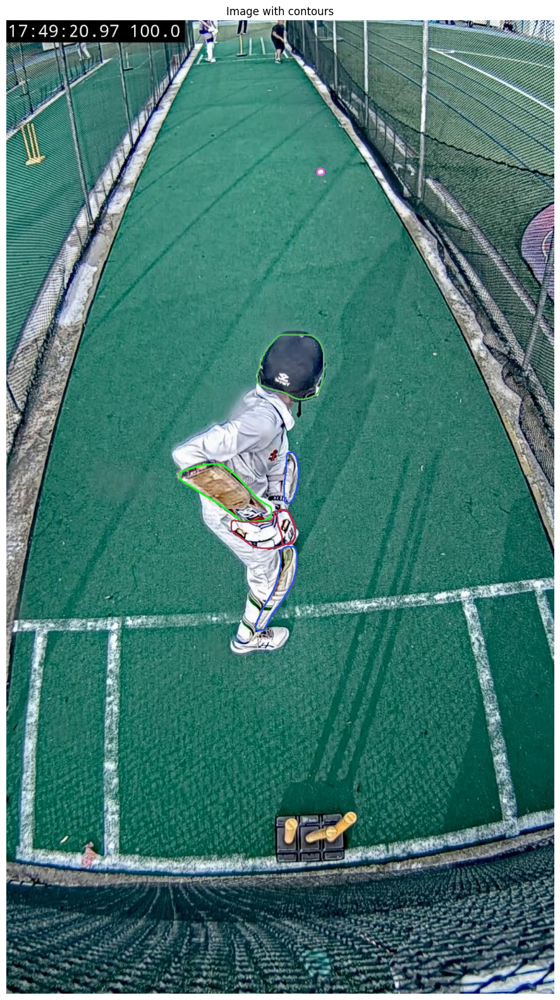

In [24]:
# Extract image from Visualizer output
# = out.get_image()[:, :, ::-1]  # Convert from BGR to RGB for matplotlib

# Create a figure
plt.figure(figsize=(40, 20))  # Set figure size to display the full-size image

# Display the image using imshow
plt.imshow(cv2.cvtColor(im, cv2.COLOR_BGR2RGB))

# Adjust plot (optional)
plt.title("Image with contours")  # Add a title
plt.axis("off")  # Hide axes

# Show the plot
plt.show()

In [20]:
height, width, channels = im.shape

area_precentage={name:0 for name in name_list}
for i in area:
    area_precentage[i]=area[i]/width/height*100


# Iterate over each mask
for i in range(masks.shape[0]):
    mask = masks[i]
    
    # Find contours from the mask
    contours, _ = cv2.findContours(mask.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # Iterate over each contour found
    for contour in contours:
        contour_temp = [coord[0].tolist() for coord in contour]
        contour_temp = np.array(contour_temp, dtype=np.int32)
        mask_midpoint = np.mean(contour_temp, axis=0, dtype=np.int32).flatten()
        cv2.drawContours(im, [contour_temp], -1, colors[name_list[int(i)]], 2)
        #Set the color for the label
        color = tuple([int((x+150)%255) for x in colors[name_list[int(i)]]])
        #Set up the label content
        content = name_list[int(i)] + str('{:.4}'.format(area_precentage[name_list[int(i)]])) + '%'
        # Add label to the midpoint
        cv2.putText(im, content, tuple(mask_midpoint), cv2.FONT_HERSHEY_SIMPLEX, 1, color, 5, cv2.LINE_AA)
        cv2.fillPoly(im, [contour_temp], color)

# Blend the overlay with the original image
alpha = 0.5
cv2.addWeighted(overlay, alpha, im, 1 - alpha, 0, im)

'''
# Display the image with contours
cv2.imshow("Mask and area percentage", im)
cv2.waitKey(0)
cv2.destroyAllWindows()
'''




'\n# Display the image with contours\ncv2.imshow("Mask and area percentage", im)\ncv2.waitKey(0)\ncv2.destroyAllWindows()\n'

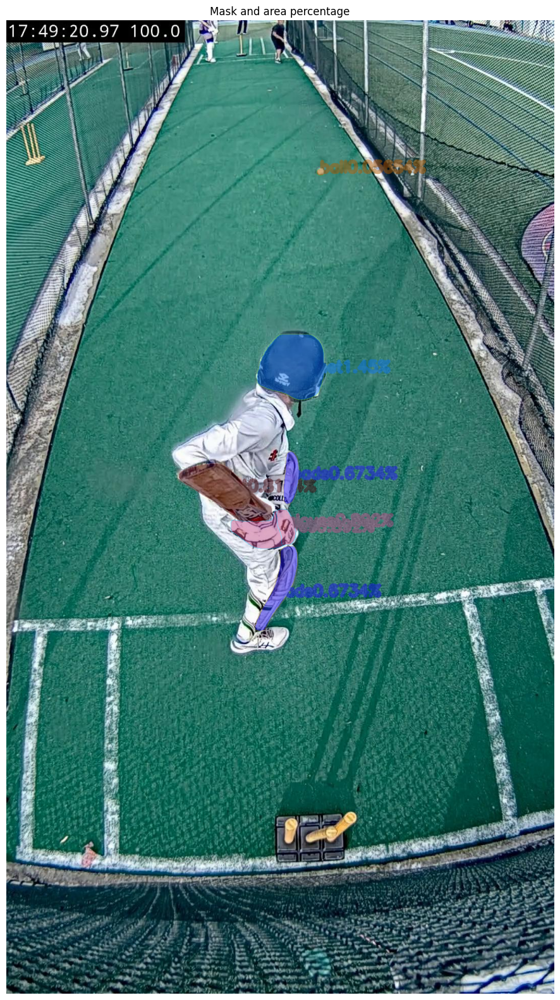

In [21]:
# Display the image with the drawn masks inline
plt.figure(figsize=(40, 20))  # Set figure size to display the full-size image
plt.imshow(cv2.cvtColor(im, cv2.COLOR_BGR2RGB))
# Adjust plot (optional)
plt.title("Mask and area percentage")  # Add a title
plt.axis('off')  # Turn off axis numbers
plt.show()


# Evaluation

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("my_dataset_test", output_dir= "./output")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
print(inference_on_dataset(predictor.model, val_loader, evaluator))

In [ ]:
# Save

In [ ]:
f = open('config.yml', 'w')
f.write(cfg.dump())
f.close()